# Document Layout Structure Matching — DocLayout-YOLO + ChromaDB

**Goal:** Use [DocLayout-YOLO](https://github.com/opendatalab/DocLayout-YOLO) to extract the *structural layout fingerprint* (detected element types + spatial positions) of each template. Store these fingerprints in ChromaDB. For any incoming document, extract its layout and retrieve the best-matching template via vector similarity search.

**Pipeline:**
```
Template / Input Document
        │
        ▼
  (PDF → page images via pypdfium2)
        │
        ▼
  DocLayout-YOLO
  → detected regions: [title, plain_text, table, figure, …]
  → bounding boxes (normalised to image dimensions)
        │
        ▼
  build_layout_descriptor()
  → rich textual descriptor encoding element types + spatial grid
        │
        ▼
  ChromaDB  (sentence-transformers default embedding)
  → index templates   /   query with input
        │
        ▼
  Top-N matched templates ranked by structural similarity
```

## 1 — Install dependencies

In [1]:
import sys, subprocess

packages = [
    "torch",
    "torchvision",
    "ultralytics",
    "doclayout-yolo",
    "huggingface_hub",
    "chromadb",
    "pypdfium2",
    "Pillow",
    "numpy",
    "matplotlib",
]

for pkg in packages:
    subprocess.check_call([sys.executable, "-m", "pip", "install", pkg])

print("All dependencies installed.")

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
All dependencies installed.


## 2 — Imports

In [2]:
import os
from pathlib import Path

import numpy as np
from PIL import Image
import pypdfium2 as pdfium
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from huggingface_hub import hf_hub_download
from doclayout_yolo import YOLOv10

import chromadb
from chromadb.utils import embedding_functions

print("Imports OK")
print(f"PyTorch  : {torch.__version__}")
print(f"CUDA     : {torch.cuda.is_available()}")

/home/dellpromax/Documents/shivam/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imports OK
PyTorch  : 2.13.0+cu130
CUDA     : True


## 3 — Configuration & Model Loading

Download the `DocStructBench` checkpoint from HuggingFace and load it into `YOLOv10`.

In [3]:
# ── Config ────────────────────────────────────────────────────────────────────
DEVICE          = "cuda" if torch.cuda.is_available() else "cpu"
IMGSZ           = 1024    # DocLayout-YOLO was trained at 1024
CONF_THRESHOLD  = 0.2     # minimum detection confidence
TOP_N_RESULTS   = 3       # how many template matches to return per query

TEMPLATE_DIR    = Path("templates")
TEST_DIR        = Path("test")
CHROMA_DB_PATH  = "./chroma_layout_db"   # persistent storage

# DocLayout-YOLO element class IDs  (DocStructBench label set)
CLASS_NAMES = {
    0: "title",
    1: "plain_text",
    2: "abandon",          # headers / footers / noise
    3: "figure",
    4: "figure_caption",
    5: "table",
    6: "table_caption",
    7: "table_footnote",
    8: "isolate_formula",
    9: "formula_caption",
}

# ── Download model checkpoint ─────────────────────────────────────────────────
print("Downloading DocLayout-YOLO checkpoint …")
model_path = hf_hub_download(
    repo_id="juliozhao/DocLayout-YOLO-DocStructBench",
    filename="doclayout_yolo_docstructbench_imgsz1024.pt",
)
model = YOLOv10(model_path)
print(f"Model loaded  → {model_path}")
print(f"Running on    → {DEVICE}")

Model loaded  → /home/dellpromax/.cache/huggingface/hub/models--juliozhao--DocLayout-YOLO-DocStructBench/snapshots/8c3299a30b8ff29a1503c4431b035b93220f7b11/doclayout_yolo_docstructbench_imgsz1024.pt
Running on    → cuda


## 4 — Initialise ChromaDB Collection

Using `PersistentClient` so the indexed templates survive kernel restarts.  
The collection is **recreated fresh** on each full run — remove the `delete_collection` call if you want to accumulate templates incrementally.

In [4]:
chroma_client = chromadb.PersistentClient(path=CHROMA_DB_PATH)

# Fresh collection — drop if it exists from a previous run
try:
    chroma_client.delete_collection("template_layouts")
    print("Dropped existing 'template_layouts' collection.")
except Exception:
    pass

collection = chroma_client.create_collection(
    name="template_layouts",
    # Default = all-MiniLM-L6-v2 sentence-transformers model
    embedding_function=embedding_functions.DefaultEmbeddingFunction(),
    metadata={"hnsw:space": "cosine"},   # cosine distance is natural for text embeddings
)
print("ChromaDB collection 'template_layouts' ready.")

Dropped existing 'template_layouts' collection.
ChromaDB collection 'template_layouts' ready.


## 5 — Helper Functions

### 5.1 Document loading (PDF → PIL images)

In [5]:
def pdf_to_images(pdf_path: str | Path, scale: float = 2.0) -> list[Image.Image]:
    """Render every page of a PDF as a PIL RGB image."""
    doc = pdfium.PdfDocument(str(pdf_path))
    return [page.render(scale=scale).to_pil().convert("RGB") for page in doc]


def load_document_pages(file_path: str | Path) -> list[Image.Image]:
    """Return a list of PIL images — one per page — for any supported document."""
    path = Path(file_path)
    ext  = path.suffix.lower()
    if ext == ".pdf":
        return pdf_to_images(path)
    elif ext in (".png", ".jpg", ".jpeg", ".tiff", ".bmp", ".gif", ".webp"):
        return [Image.open(path).convert("RGB")]
    else:
        print(f"  Unsupported file type: {ext} — skipping {path.name}")
        return []

### 5.2 Layout detection with DocLayout-YOLO

In [6]:
def detect_layout(image: Image.Image) -> list[dict]:
    """
    Run DocLayout-YOLO on a PIL image.

    Returns a list of detections sorted top-to-bottom:
      {
        class_id   : int,
        class_name : str,
        conf       : float,
        cx_norm    : float,   # centre-x  relative to image width  (0–1)
        cy_norm    : float,   # centre-y  relative to image height (0–1)
        w_norm     : float,   # width     relative to image width  (0–1)
        h_norm     : float,   # height    relative to image height (0–1)
        area_norm  : float,   # w_norm × h_norm
      }
    """
    img_w, img_h = image.size
    results = model.predict(
        image,
        imgsz=IMGSZ,
        conf=CONF_THRESHOLD,
        device=DEVICE,
        verbose=False,
    )

    detections: list[dict] = []
    if results and results[0].boxes is not None:
        boxes = results[0].boxes
        for i in range(len(boxes)):
            x1, y1, x2, y2 = boxes.xyxy[i].cpu().numpy().tolist()
            cls  = int(boxes.cls[i].item())
            conf = float(boxes.conf[i].item())
            cx = (x1 + x2) / 2 / img_w
            cy = (y1 + y2) / 2 / img_h
            w  = (x2 - x1) / img_w
            h  = (y2 - y1) / img_h
            detections.append({
                "class_id"  : cls,
                "class_name": CLASS_NAMES.get(cls, f"class_{cls}"),
                "conf"      : round(conf, 3),
                "cx_norm"   : round(cx, 4),
                "cy_norm"   : round(cy, 4),
                "w_norm"    : round(w,  4),
                "h_norm"    : round(h,  4),
                "area_norm" : round(w * h, 5),
            })

    # Sort top-to-bottom (reading order approximation)
    detections.sort(key=lambda d: d["cy_norm"])
    return detections

### 5.3 Structural descriptor builder

Converts raw detection boxes into a rich **textual structural descriptor** that captures:
- Which element types are present and how many of each
- Spatial distribution across a 3×3 grid (top/middle/bottom × left/centre/right)
- Reading-order sequence of meaningful elements
- Dominant layout pattern (e.g. "table-heavy", "text-heavy")

This text is what gets embedded by sentence-transformers and stored in ChromaDB.

In [7]:
# Elements considered structurally meaningful for COO documents
_MEANINGFUL = {"title", "plain_text", "figure", "figure_caption",
               "table", "table_caption", "table_footnote",
               "isolate_formula", "formula_caption"}


def _spatial_zone(cx: float, cy: float) -> str:
    """Map normalised (cx, cy) to a 3×3 grid zone label."""
    col = "left"   if cx < 0.35 else ("centre" if cx < 0.65 else "right")
    row = "top"    if cy < 0.33 else ("middle"  if cy < 0.67 else "bottom")
    return f"{row}-{col}"


def build_layout_descriptor(detections: list[dict]) -> str:
    """
    Build a textual structural descriptor from DocLayout-YOLO detections.

    The descriptor encodes:
      1. Total element counts per class
      2. Which element types occupy each zone of the 3×3 spatial grid
      3. Reading-order element sequence (top-to-bottom, skipping noise)
      4. Overall layout character (dominant element type + coverage stats)
    """
    if not detections:
        return "empty document layout: no structural elements detected"

    # 1. Element type counts
    counts: dict[str, int] = {}
    for d in detections:
        counts[d["class_name"]] = counts.get(d["class_name"], 0) + 1

    total = len(detections)
    count_str = ", ".join(
        f"{v} {k.replace('_', ' ')}"
        for k, v in sorted(counts.items())
    )

    # 2. Spatial grid — which element types appear in each zone
    grid: dict[str, set[str]] = {}
    for d in detections:
        zone = _spatial_zone(d["cx_norm"], d["cy_norm"])
        grid.setdefault(zone, set()).add(d["class_name"].replace("_", " "))

    grid_str = "; ".join(
        f"{zone}: [{', '.join(sorted(items))}]"
        for zone, items in sorted(grid.items())
    )

    # 3. Dominant element type (by count, excluding 'abandon')
    meaningful_counts = {k: v for k, v in counts.items() if k in _MEANINGFUL}
    dominant = max(meaningful_counts, key=meaningful_counts.get) if meaningful_counts else "none"

    # 4. Reading-order sequence (skip abandon/noise)
    sequence = [
        f"{d['class_name'].replace('_', ' ')} at {_spatial_zone(d['cx_norm'], d['cy_norm'])}"
        for d in detections
        if d["class_name"] in _MEANINGFUL
    ]

    # 5. Area-weighted coverage (how much of the page is occupied per class)
    area_by_class: dict[str, float] = {}
    for d in detections:
        if d["class_name"] in _MEANINGFUL:
            area_by_class[d["class_name"]] = area_by_class.get(d["class_name"], 0.0) + d["area_norm"]
    coverage_str = ", ".join(
        f"{k.replace('_', ' ')} {v*100:.1f}%"
        for k, v in sorted(area_by_class.items(), key=lambda x: -x[1])
    )

    descriptor = (
        f"Document structural layout with {total} detected regions. "
        f"Element counts: {count_str}. "
        f"Dominant element: {dominant.replace('_', ' ')}. "
        f"Spatial grid (zone: [types]): {grid_str}. "
        f"Page coverage: {coverage_str}. "
        f"Reading-order sequence: {'; '.join(sequence)}."
    )
    return descriptor


print("Helper functions defined.")

Helper functions defined.


### 5.4 Visualisation helper

In [8]:
_VIZ_COLORS = {
    "title"            : "#e74c3c",
    "plain_text"       : "#3498db",
    "abandon"          : "#95a5a6",
    "figure"           : "#2ecc71",
    "figure_caption"   : "#1abc9c",
    "table"            : "#f39c12",
    "table_caption"    : "#e67e22",
    "table_footnote"   : "#d35400",
    "isolate_formula"  : "#9b59b6",
    "formula_caption"  : "#8e44ad",
}


def visualize_layout(
    image: Image.Image,
    detections: list[dict],
    title: str = "DocLayout-YOLO — detected structure",
) -> None:
    """Draw detected layout regions on top of the document image."""
    fig, ax = plt.subplots(figsize=(10, 14))
    ax.imshow(image)
    img_w, img_h = image.size

    for d in detections:
        cx = d["cx_norm"] * img_w
        cy = d["cy_norm"] * img_h
        w  = d["w_norm"]  * img_w
        h  = d["h_norm"]  * img_h
        x1, y1 = cx - w / 2, cy - h / 2

        color = _VIZ_COLORS.get(d["class_name"], "#ffffff")
        rect  = patches.Rectangle(
            (x1, y1), w, h,
            linewidth=2, edgecolor=color, facecolor="none", alpha=0.85,
        )
        ax.add_patch(rect)
        ax.text(
            x1 + 4, y1 + 14,
            f"{d['class_name']}  {d['conf']:.2f}",
            color="white",
            fontsize=7,
            fontweight="bold",
            bbox=dict(facecolor=color, alpha=0.7, pad=1, edgecolor="none"),
        )

    ax.set_title(title, fontsize=12)
    ax.axis("off")
    plt.tight_layout()
    plt.show()

## 6 — Index Templates into ChromaDB

For every file in `templates/`:
1. Convert to PIL page images
2. Run DocLayout-YOLO
3. Build a structural descriptor
4. Upsert into ChromaDB (document = descriptor, metadata = provenance)

In [9]:
documents_to_add : list[str]  = []
metadatas_to_add : list[dict] = []
ids_to_add       : list[str]  = []

# all_detections stores raw detections for later visualisation
all_template_detections: list[dict] = []  # {file, page, image, detections}

for file_idx, filename in enumerate(sorted(os.listdir(TEMPLATE_DIR))):
    file_path = TEMPLATE_DIR / filename
    if not file_path.is_file():
        continue

    print(f"\n─── Template [{file_idx}]: {filename}")
    pages = load_document_pages(file_path)

    for page_idx, page_img in enumerate(pages):
        detections = detect_layout(page_img)
        descriptor = build_layout_descriptor(detections)

        doc_id = f"tpl_{file_idx}_p{page_idx + 1}"

        # Summary stats
        counts = {}
        for d in detections:
            counts[d["class_name"]] = counts.get(d["class_name"], 0) + 1
        stats = ", ".join(f"{k}×{v}" for k, v in sorted(counts.items()))

        print(f"  Page {page_idx + 1}:  {len(detections)} elements  ({stats})")
        print(f"  Descriptor (preview): {descriptor[:140]} …")

        documents_to_add.append(descriptor)
        metadatas_to_add.append({
            "template_file" : filename,
            "file_path"     : str(file_path),
            "page_number"   : page_idx + 1,
            "total_pages"   : len(pages),
            "num_elements"  : len(detections),
            "element_stats" : stats,
        })
        ids_to_add.append(doc_id)

        all_template_detections.append({
            "file"       : filename,
            "page"       : page_idx + 1,
            "image"      : page_img,
            "detections" : detections,
        })

if documents_to_add:
    collection.add(
        documents=documents_to_add,
        metadatas=metadatas_to_add,
        ids=ids_to_add,
    )
    print(f"\n✓ Indexed {len(documents_to_add)} template page(s) into ChromaDB.")
    print(f"  Collection size: {collection.count()} document(s)")
else:
    print("⚠ No templates found in the templates/ directory.")


─── Template [0]: CoO UN template.png
  Page 1:  2 elements  (table×1, title×1)
  Descriptor (preview): Document structural layout with 2 detected regions. Element counts: 1 table, 1 title. Dominant element: title. Spatial grid (zone: [types]): …

─── Template [1]: CoO WCO (kyoto).png
  Page 1:  1 elements  (table×1)
  Descriptor (preview): Document structural layout with 1 detected regions. Element counts: 1 table. Dominant element: table. Spatial grid (zone: [types]): middle-c …

─── Template [2]: Egypt- CoO Templates.pdf
  Page 1:  1 elements  (figure×1)
  Descriptor (preview): Document structural layout with 1 detected regions. Element counts: 1 figure. Dominant element: figure. Spatial grid (zone: [types]): middle …
  Page 2:  1 elements  (figure×1)
  Descriptor (preview): Document structural layout with 1 detected regions. Element counts: 1 figure. Dominant element: figure. Spatial grid (zone: [types]): middle …
  Page 3:  1 elements  (figure×1)
  Descriptor (preview): Document 

/home/dellpromax/.cache/chroma/onnx_models/all-MiniLM-L6-v2/onnx.tar.gz: 100%|██████████| 79.3M/79.3M [00:55<00:00, 1.49MiB/s]  



✓ Indexed 12 template page(s) into ChromaDB.
  Collection size: 12 document(s)


## 7 — Visualise Template Structure

Inspect what DocLayout-YOLO found in each indexed template page.

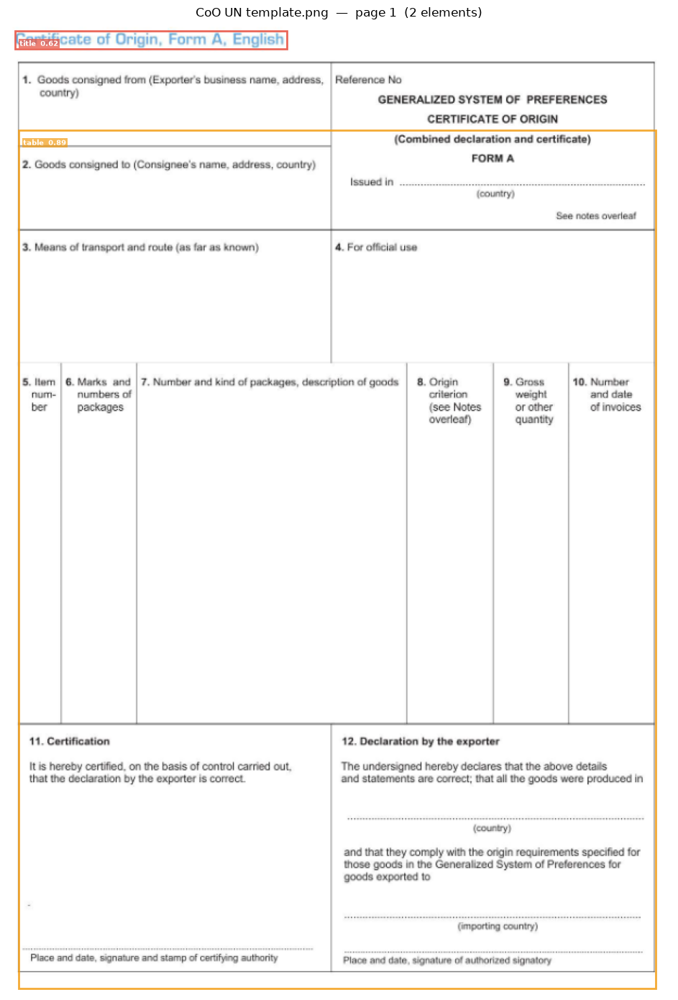

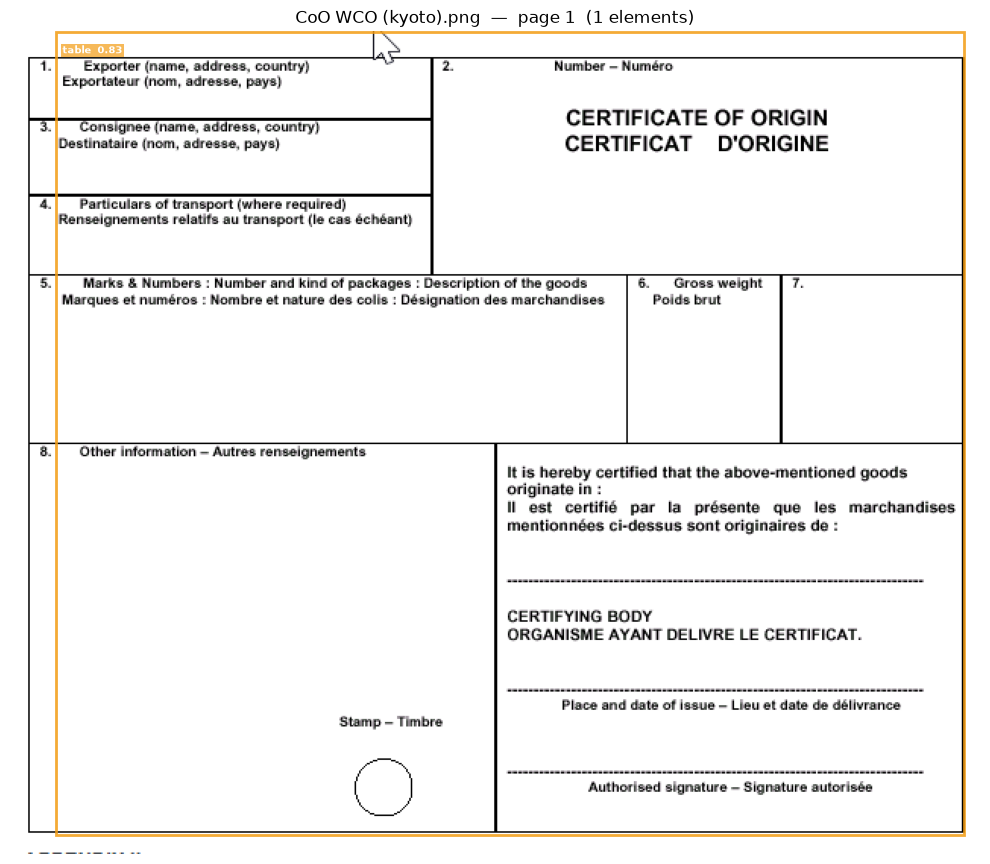

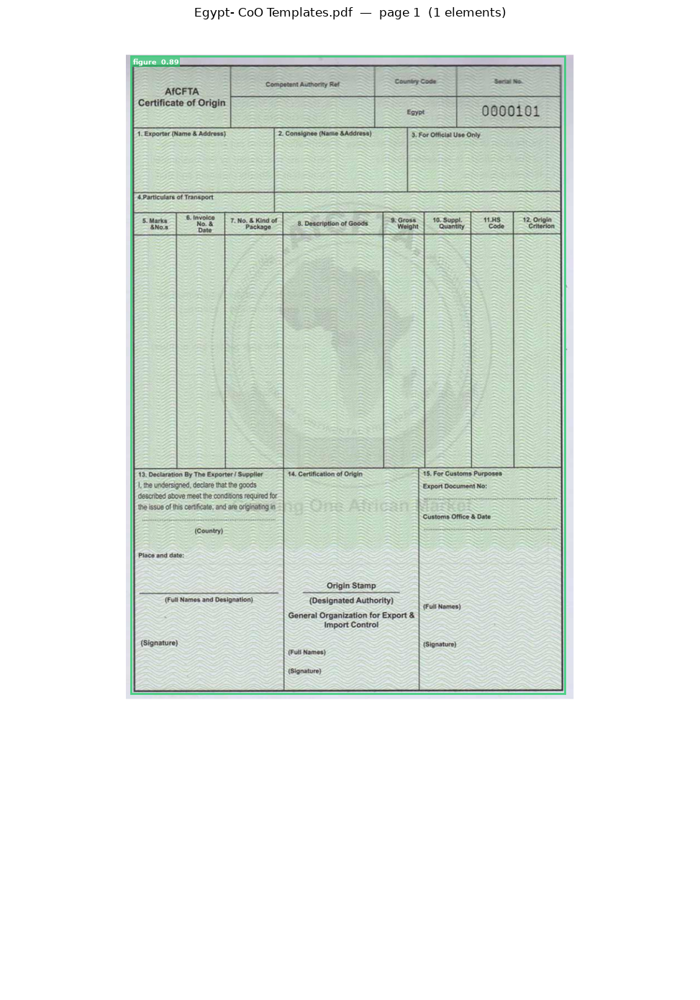

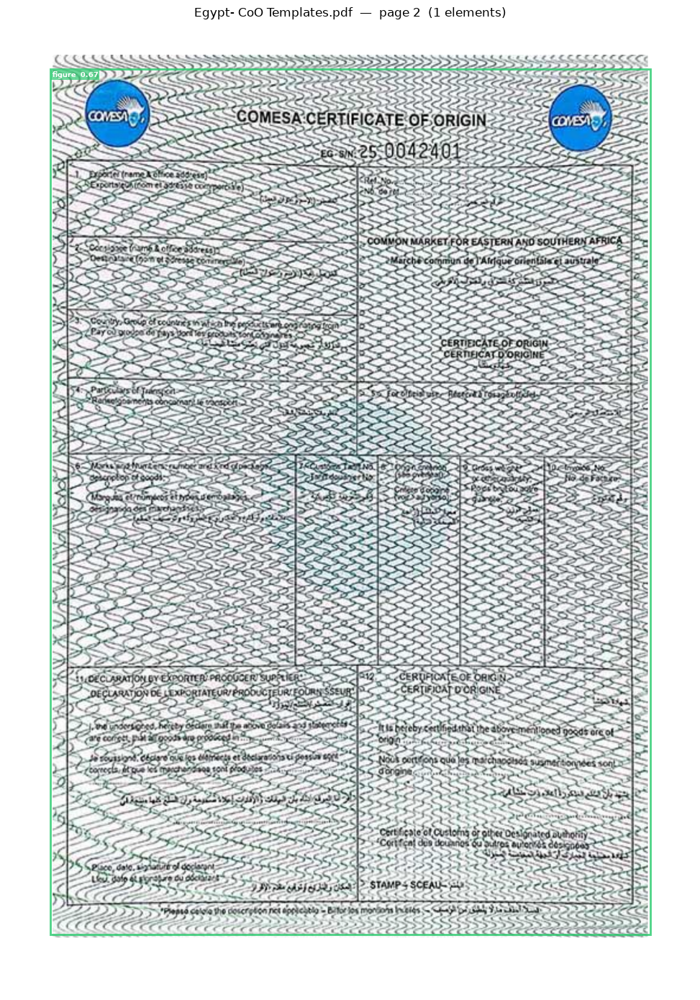

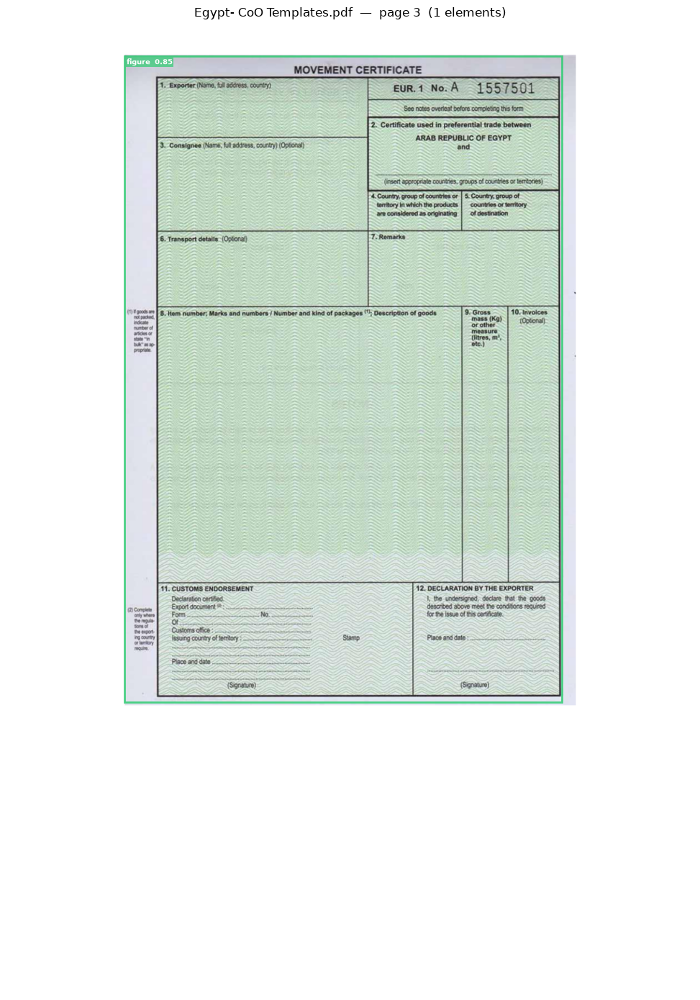

...

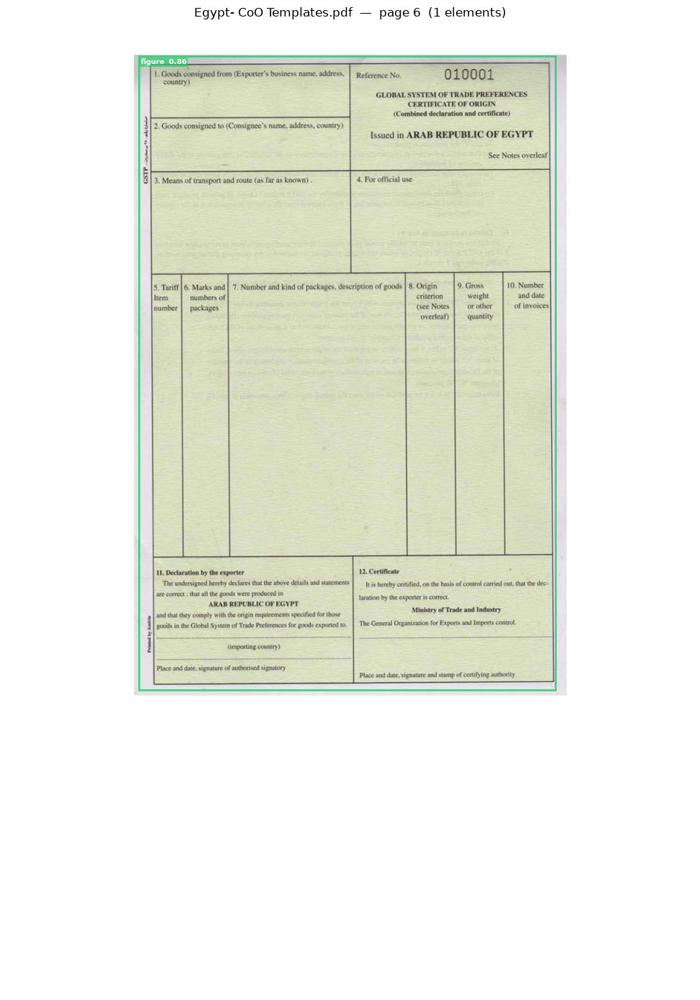

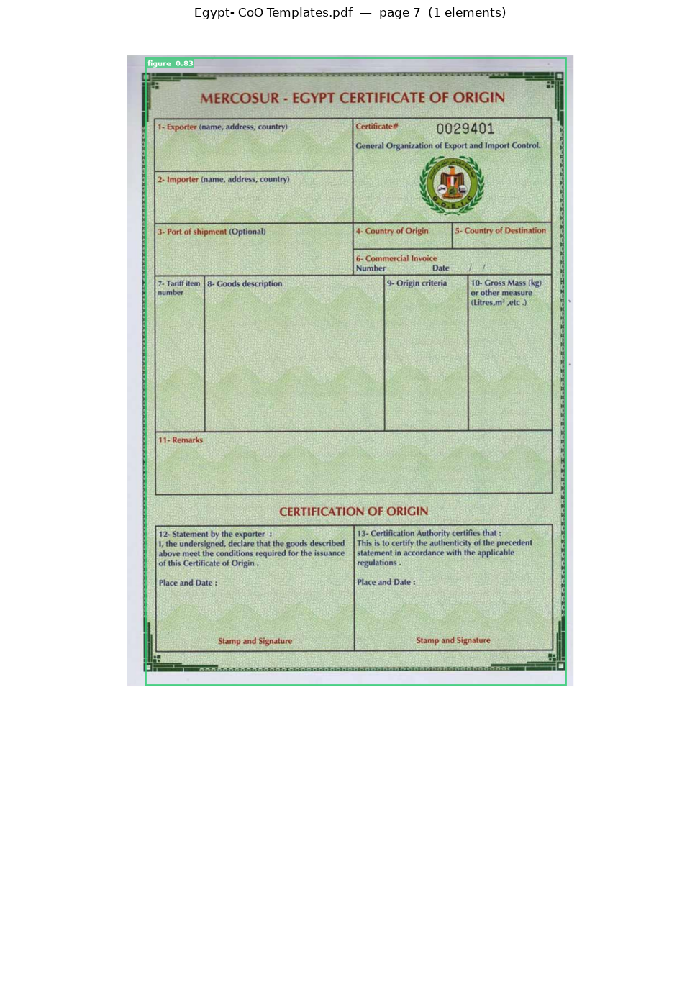

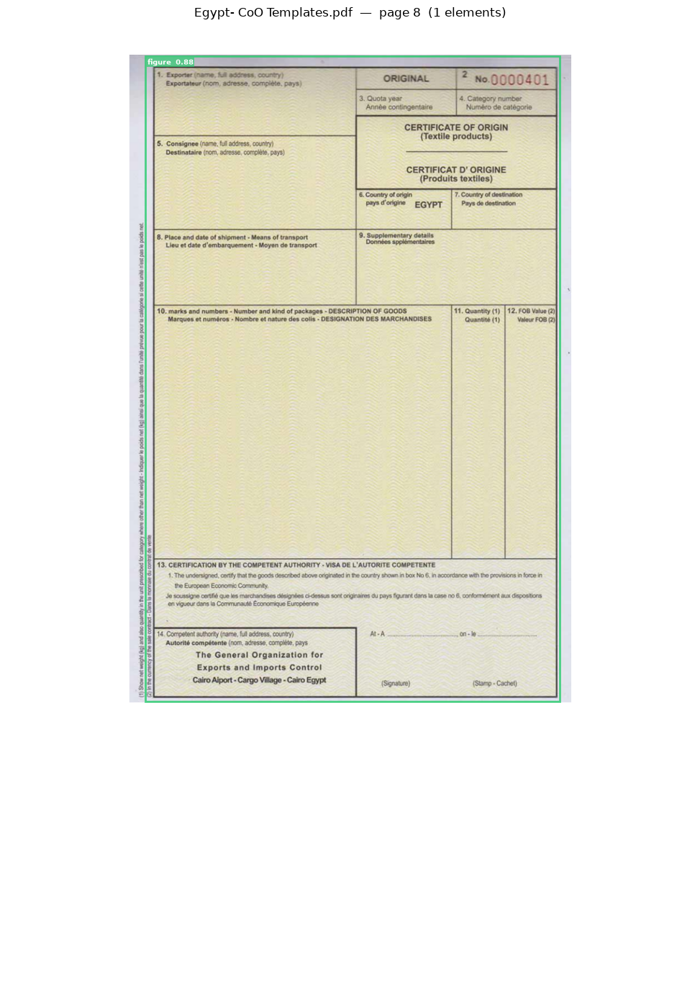

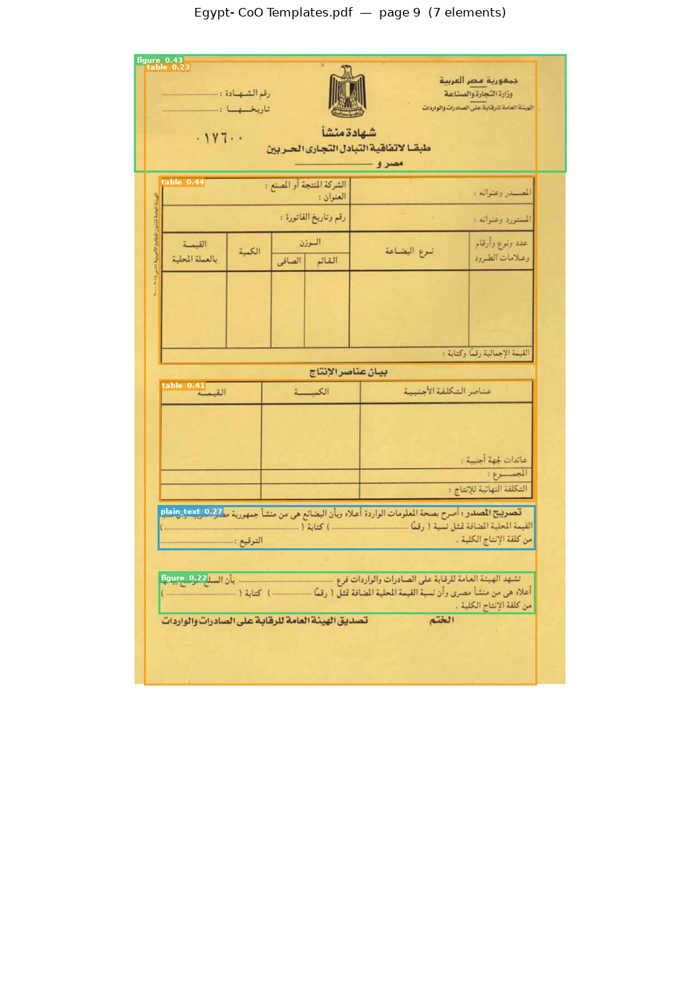

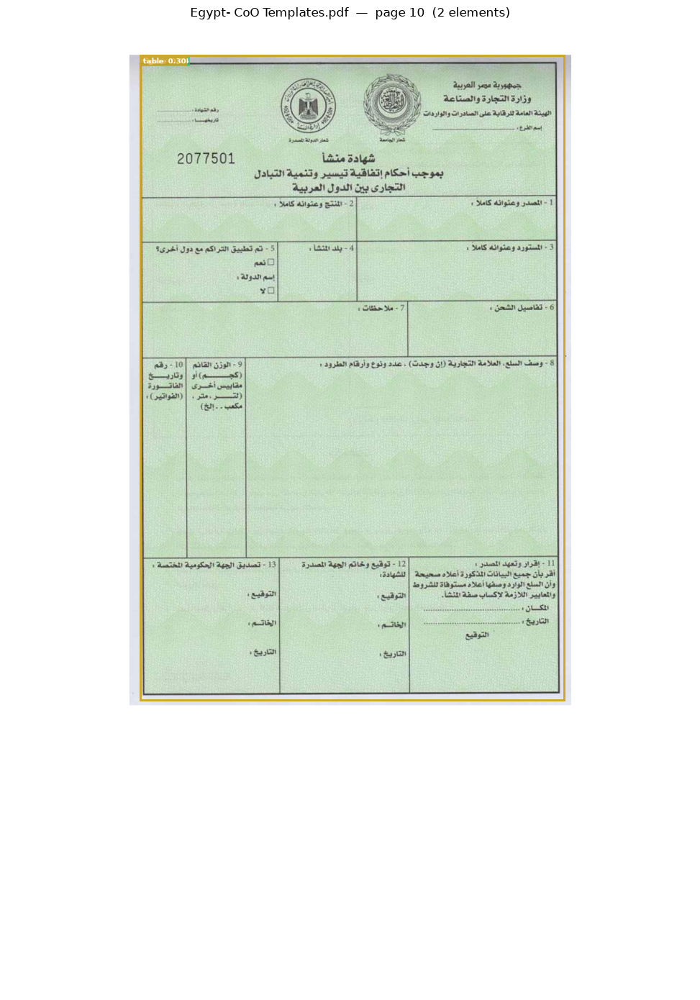

In [10]:
for entry in all_template_detections:
    title = f"{entry['file']}  —  page {entry['page']}  ({entry['detections'].__len__()} elements)"
    visualize_layout(entry["image"], entry["detections"], title=title)

## 8 — Match Incoming Documents

Run DocLayout-YOLO on each document in `test/`, build its structural descriptor, and query ChromaDB for the best-matching template.

In [11]:
def match_template(
    query_path: str | Path,
    n_results: int = TOP_N_RESULTS,
    visualize: bool = True,
) -> dict | None:
    """
    Extract the layout structure of an input document and retrieve
    the top-N most structurally similar templates from ChromaDB.

    Returns a dict with the best match metadata, or None if the collection
    is empty or the document could not be processed.
    """
    query_path = Path(query_path)
    print(f"\n{'═'*65}")
    print(f"  QUERY: {query_path.name}")
    print(f"{'═'*65}")

    pages = load_document_pages(query_path)
    if not pages:
        print("  ✗ Could not load document.")
        return None

    # Use the first page as the structural representative
    # (can be extended to aggregate multi-page signatures)
    query_image    = pages[0]
    detections     = detect_layout(query_image)
    query_descriptor = build_layout_descriptor(detections)

    counts = {}
    for d in detections:
        counts[d["class_name"]] = counts.get(d["class_name"], 0) + 1
    stats = ", ".join(f"{k}×{v}" for k, v in sorted(counts.items()))

    print(f"  Detected {len(detections)} elements:  {stats}")
    print(f"  Descriptor (preview): {query_descriptor[:150]} …\n")

    if visualize:
        visualize_layout(
            query_image, detections,
            title=f"Query: {query_path.name}",
        )

    n = min(n_results, collection.count())
    if n == 0:
        print("  ✗ ChromaDB collection is empty — index templates first.")
        return None

    results = collection.query(
        query_texts=[query_descriptor],
        n_results=n,
    )

    print(f"  TOP {n} STRUCTURAL MATCHES:")
    print(f"  {'─'*60}")

    best_match = None
    for rank, (doc_id, meta, distance, matched_doc) in enumerate(
        zip(
            results["ids"][0],
            results["metadatas"][0],
            results["distances"][0],
            results["documents"][0],
        ),
        start=1,
    ):
        similarity = 1.0 - distance   # cosine distance → similarity
        marker     = "★" if rank == 1 else f"  {rank}."
        print(f"  {marker}  Template : {meta['template_file']}")
        print(f"      Page      : {meta['page_number']} / {meta['total_pages']}")
        print(f"      Elements  : {meta['num_elements']}  ({meta['element_stats']})")
        print(f"      Distance  : {distance:.4f}   Similarity : {similarity:.4f}")
        print()
        if rank == 1:
            best_match = {"id": doc_id, "metadata": meta, "distance": distance, "similarity": similarity}

    return best_match


═════════════════════════════════════════════════════════════════
  QUERY: certificat of origine..pdf
═════════════════════════════════════════════════════════════════
  Detected 1 elements:  figure×1
  Descriptor (preview): Document structural layout with 1 detected regions. Element counts: 1 figure. Dominant element: figure. Spatial grid (zone: [types]): middle-centre: [ …



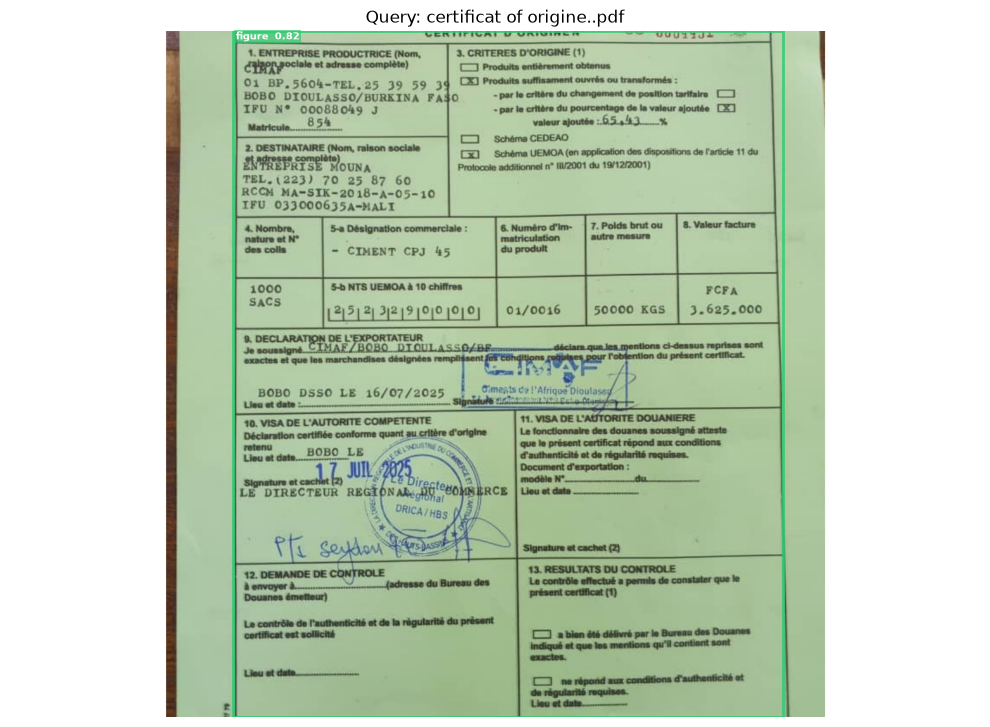

  TOP 3 STRUCTURAL MATCHES:
  ────────────────────────────────────────────────────────────
  ★  Template : Egypt- CoO Templates.pdf
      Page      : 1 / 10
      Elements  : 1  (figure×1)
      Distance  : 0.0005   Similarity : 0.9995

    2.  Template : Egypt- CoO Templates.pdf
      Page      : 3 / 10
      Elements  : 1  (figure×1)
      Distance  : 0.0008   Similarity : 0.9992

    3.  Template : Egypt- CoO Templates.pdf
      Page      : 7 / 10
      Elements  : 1  (figure×1)
      Distance  : 0.0008   Similarity : 0.9992


═════════════════════════════════════════════════════════════════
  QUERY: certificat of origine.pdf
═════════════════════════════════════════════════════════════════
  Detected 3 elements:  abandon×1, figure×1, table×1
  Descriptor (preview): Document structural layout with 3 detected regions. Element counts: 1 abandon, 1 figure, 1 table. Dominant element: figure. Spatial grid (zone: [types …



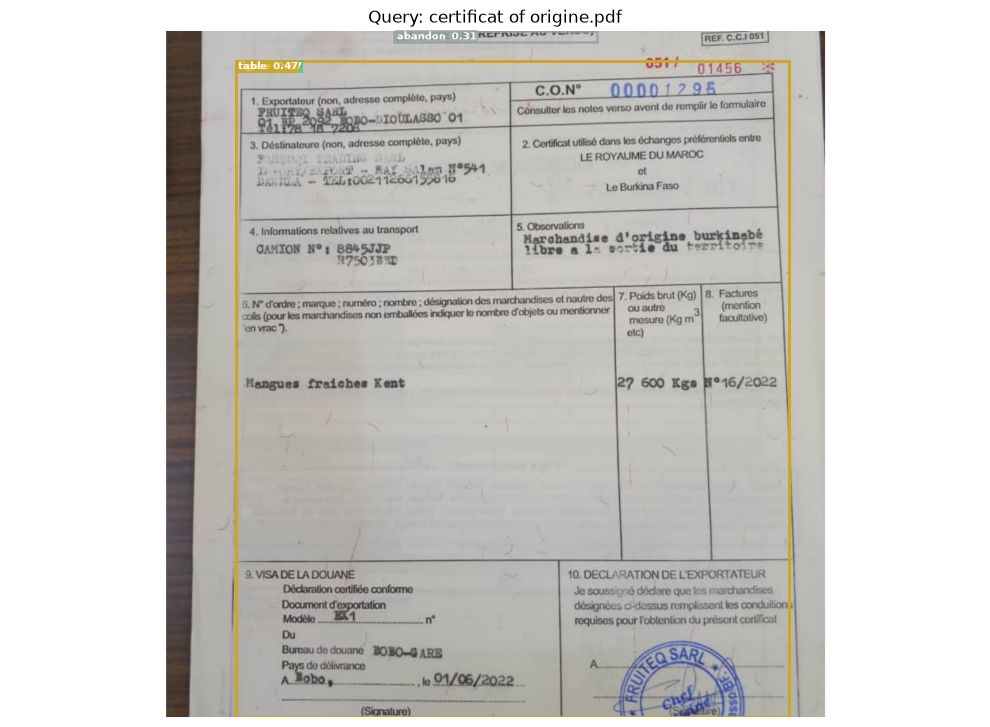

  TOP 3 STRUCTURAL MATCHES:
  ────────────────────────────────────────────────────────────
  ★  Template : Egypt- CoO Templates.pdf
      Page      : 10 / 10
      Elements  : 2  (figure×1, table×1)
      Distance  : 0.0328   Similarity : 0.9672

    2.  Template : Egypt- CoO Templates.pdf
      Page      : 9 / 10
      Elements  : 7  (figure×3, plain_text×1, table×3)
      Distance  : 0.0594   Similarity : 0.9406

    3.  Template : Egypt- CoO Templates.pdf
      Page      : 8 / 10
      Elements  : 1  (figure×1)
      Distance  : 0.0615   Similarity : 0.9385


═════════════════════════════════════════════════════════════════
 SUMMARY — Best structural match per input document
═════════════════════════════════════════════════════════════════
  certificat of origine..pdf
    → Egypt- CoO Templates.pdf  (page 1)  similarity = 0.9995

  certificat of origine.pdf
    → Egypt- CoO Templates.pdf  (page 10)  similarity = 0.9672



In [12]:
# Run matching on every file in the test/ folder
best_matches: dict[str, dict] = {}

for test_filename in sorted(os.listdir(TEST_DIR)):
    test_path = TEST_DIR / test_filename
    if test_path.is_file():
        result = match_template(test_path, n_results=TOP_N_RESULTS, visualize=True)
        if result:
            best_matches[test_filename] = result

# ── Summary table ──────────────────────────────────────────────────────────────
print("\n" + "═" * 65)
print(" SUMMARY — Best structural match per input document")
print("═" * 65)
for doc_name, match in best_matches.items():
    m = match["metadata"]
    print(
        f"  {doc_name}\n"
        f"    → {m['template_file']}  (page {m['page_number']})  "
        f"similarity = {match['similarity']:.4f}\n"
    )

## 9 — (Optional) Single-document ad-hoc query

Change `QUERY_FILE` to any document path you want to test.

In [ ]:
QUERY_FILE = "test/certificat of origine.pdf"   # ← edit as needed

match_template(QUERY_FILE, n_results=TOP_N_RESULTS, visualize=True)